In [39]:
import pandas as pd 
import matplotlib.pyplot as plt
import matplotlib as mpl

In [40]:
df = pd.read_pickle('../data/interim/01_data_resampled.pkl')

In [41]:
df

,acc_x,acc_y,acc_z,gyro_x,gyro_y,gyro_z,participant,label,category,set
epoch (ms),,,,,,,,,,
2019-01-11 15:08:05.200,0.013500,0.977000,-0.071000,-1.8904,2.4392,0.9388,B,bench,heavy,30
2019-01-11 15:08:05.400,-0.001500,0.970500,-0.079500,-1.6826,-0.8904,2.1708,B,bench,heavy,30
2019-01-11 15:08:05.600,0.001333,0.971667,-0.064333,2.5608,-0.2560,-1.4146,B,bench,heavy,30
2019-01-11 15:08:05.800,-0.024000,0.957000,-0.073500,8.0610,-4.5244,-2.0730,B,bench,heavy,30
2019-01-11 15:08:06.000,-0.028000,0.957667,-0.115000,2.4390,-1.5486,-3.6098,B,bench,heavy,30
...,...,...,...,...,...,...,...,...,...,...
2019-01-20 17:33:27.000,-0.048000,-1.041500,-0.076500,1.4146,-5.6218,0.2926,E,row,medium,90
2019-01-20 17:33:27.200,-0.037000,-1.030333,-0.053333,-2.7684,-0.5854,2.2440,E,row,medium,90
2019-01-20 17:33:27.400,-0.060000,-1.031000,-0.082000,2.8416,-5.1342,-0.1220,E,row,medium,90


In [42]:
set_df = df[df['set']==1]

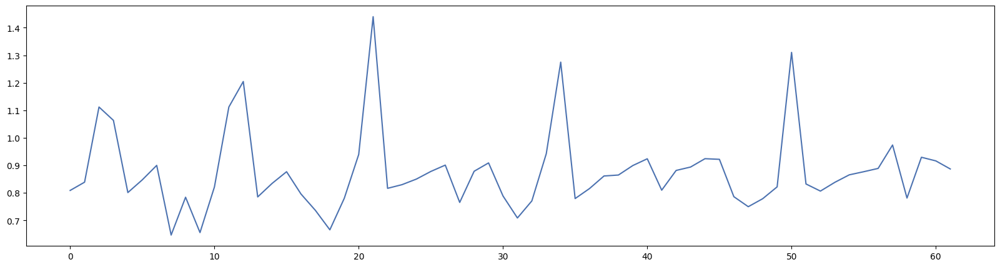

In [43]:
plt.plot(set_df['acc_y'].reset_index(drop=True))

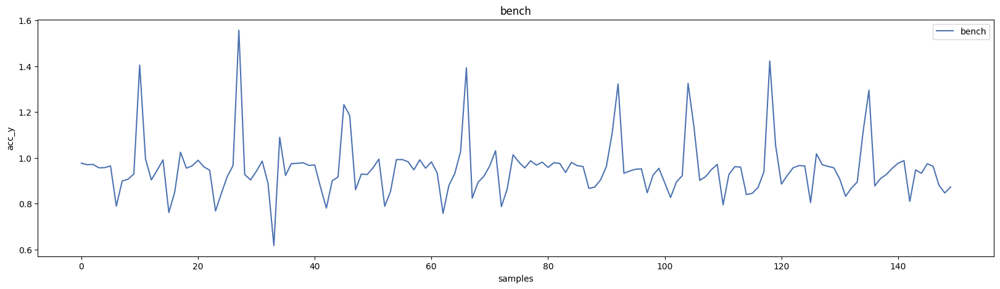

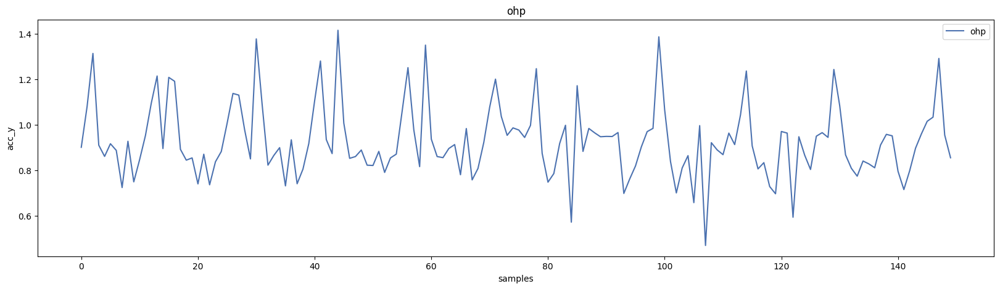

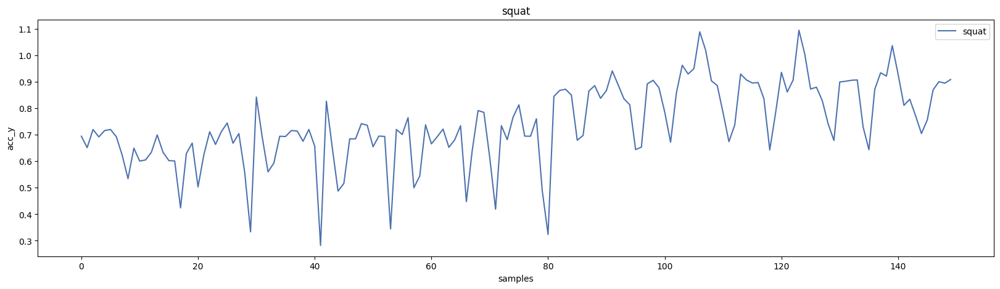

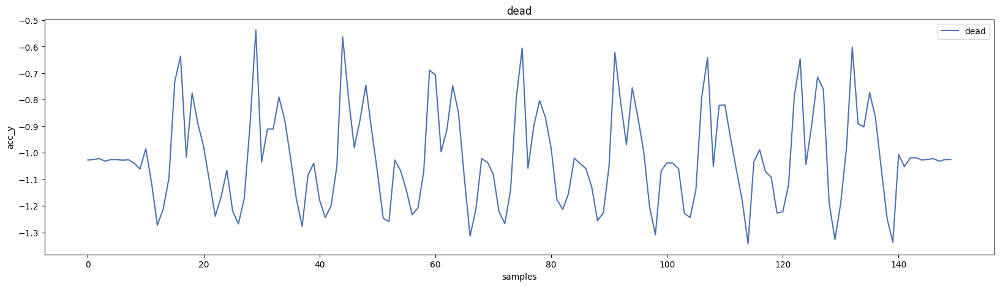

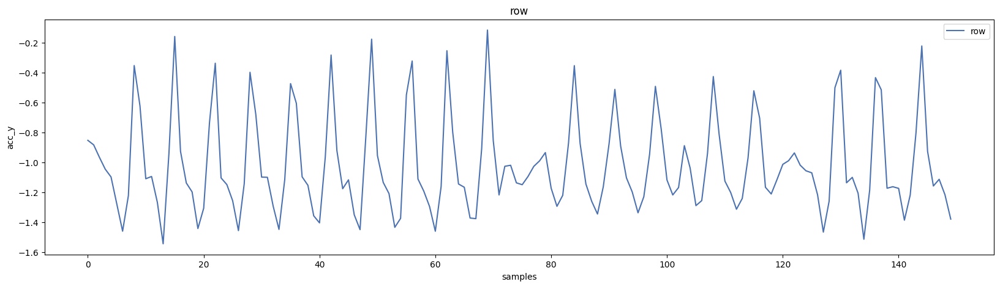

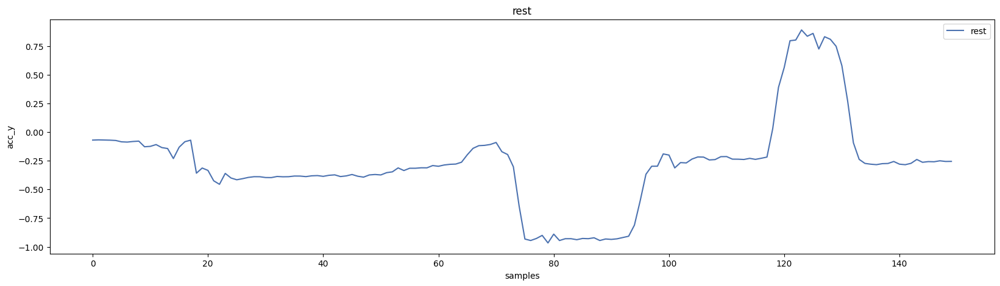

In [44]:
for label in df['label'].unique():
    subset = df[df['label']==label]
    fig , ax  =plt.subplots()
    plt.plot(subset[:150]['acc_y'].reset_index(drop=True),label=label)
    ax.set_title(label)
    ax.set_xlabel("samples")
    ax.set_ylabel("acc_y")
    plt.legend()
    plt.show()

In [45]:
mpl.style.use("seaborn-v0_8-deep")
mpl.rcParams["figure.figsize"]=(20,5)
mpl.rcParams["figure.dpi"]=100

In [46]:
df.label.value_counts()

label
ohp      1676
bench    1665
squat    1610
dead     1531
row      1417
rest     1110
Name: count, dtype: int64

In [47]:
category_df = df.query('label == "squat"').query('participant == "A"').reset_index()

Text(0, 0.5, 'acc_y')

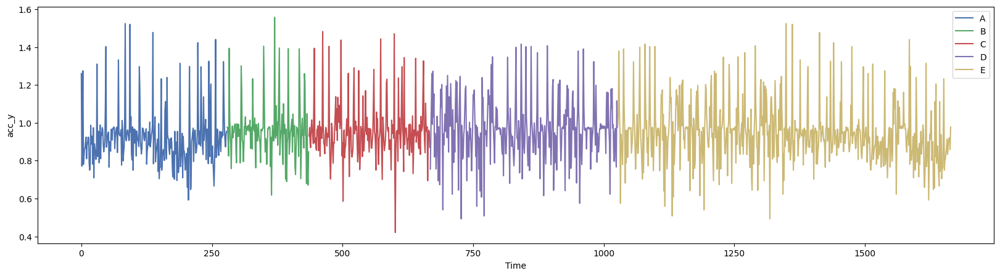

In [48]:
participant_df=df.query('label == "bench"').sort_values("participant").reset_index()
participant_df.groupby(["participant"])['acc_y'].plot(legend=True)
plt.xlabel("Time")
plt.ylabel("acc_y")

In [49]:
df["label"].value_counts()

label
ohp      1676
bench    1665
squat    1610
dead     1531
row      1417
rest     1110
Name: count, dtype: int64

In [50]:
df["participant"].value_counts()

participant
A    2988
E    2645
C    1481
D    1052
B     843
Name: count, dtype: int64

In [51]:
df[df['label']=='ohp']

,acc_x,acc_y,acc_z,gyro_x,gyro_y,gyro_z,participant,label,category,set
epoch (ms),,,,,,,,,,
2019-01-11 15:38:55.000,-0.062500,0.901000,0.047000,0.4390,-6.5000,-0.0854,A,ohp,heavy,9
2019-01-11 15:38:55.200,-0.080667,1.080667,0.060333,5.5976,-3.2196,-1.4266,A,ohp,heavy,9
2019-01-11 15:38:55.400,-0.137500,1.314000,0.024000,20.8534,7.7562,-44.1340,A,ohp,heavy,9
2019-01-11 15:38:55.600,-0.234667,0.910333,-0.007000,17.7684,11.4880,-35.0002,A,ohp,heavy,9
2019-01-11 15:38:55.800,-0.337000,0.861000,-0.095500,2.3778,2.2682,-4.6220,A,ohp,heavy,9
...,...,...,...,...,...,...,...,...,...,...
2019-01-15 13:55:56.600,-0.218667,1.206667,-0.129333,-32.1462,-11.7194,35.2438,E,ohp,heavy,78
2019-01-15 13:55:56.800,-0.095500,1.135500,-0.097000,27.0488,-2.8536,-0.0976,E,ohp,heavy,78
2019-01-15 13:55:57.000,-0.122667,0.944000,-0.114000,-15.6584,-3.2318,-4.2560,E,ohp,heavy,78


In [52]:
df.query("label =='ohp'")

,acc_x,acc_y,acc_z,gyro_x,gyro_y,gyro_z,participant,label,category,set
epoch (ms),,,,,,,,,,
2019-01-11 15:38:55.000,-0.062500,0.901000,0.047000,0.4390,-6.5000,-0.0854,A,ohp,heavy,9
2019-01-11 15:38:55.200,-0.080667,1.080667,0.060333,5.5976,-3.2196,-1.4266,A,ohp,heavy,9
2019-01-11 15:38:55.400,-0.137500,1.314000,0.024000,20.8534,7.7562,-44.1340,A,ohp,heavy,9
2019-01-11 15:38:55.600,-0.234667,0.910333,-0.007000,17.7684,11.4880,-35.0002,A,ohp,heavy,9
2019-01-11 15:38:55.800,-0.337000,0.861000,-0.095500,2.3778,2.2682,-4.6220,A,ohp,heavy,9
...,...,...,...,...,...,...,...,...,...,...
2019-01-15 13:55:56.600,-0.218667,1.206667,-0.129333,-32.1462,-11.7194,35.2438,E,ohp,heavy,78
2019-01-15 13:55:56.800,-0.095500,1.135500,-0.097000,27.0488,-2.8536,-0.0976,E,ohp,heavy,78
2019-01-15 13:55:57.000,-0.122667,0.944000,-0.114000,-15.6584,-3.2318,-4.2560,E,ohp,heavy,78


<Axes: >

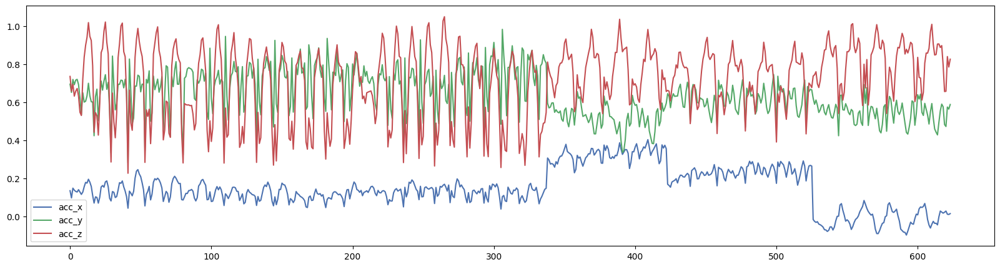

In [56]:
label = 'squat'
participant = "A"
all_axis_df = df.query(f'label =="{label}"').query(f'participant== "{participant}"').reset_index()
fig,ax = plt.subplots()
all_axis_df[["acc_x", "acc_y", "acc_z"]].plot(ax=ax)

/tmp/ipykernel_10394/149054078.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig,ax = plt.subplots()


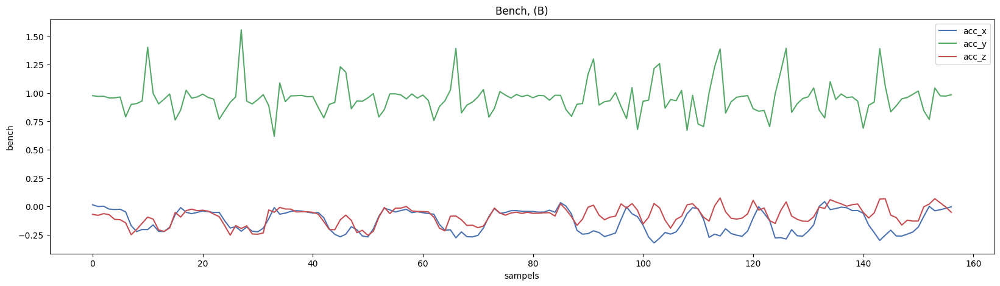

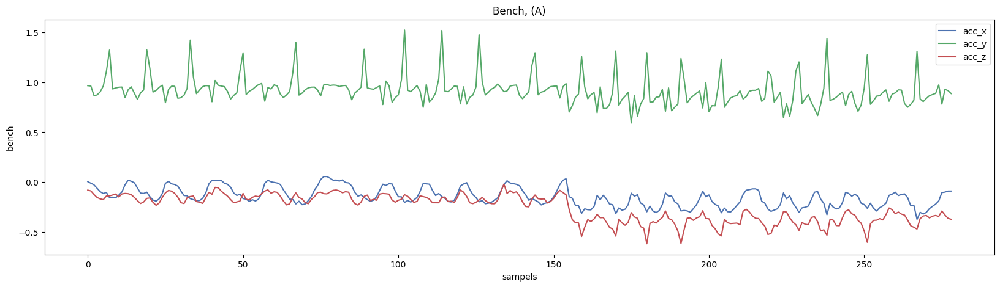

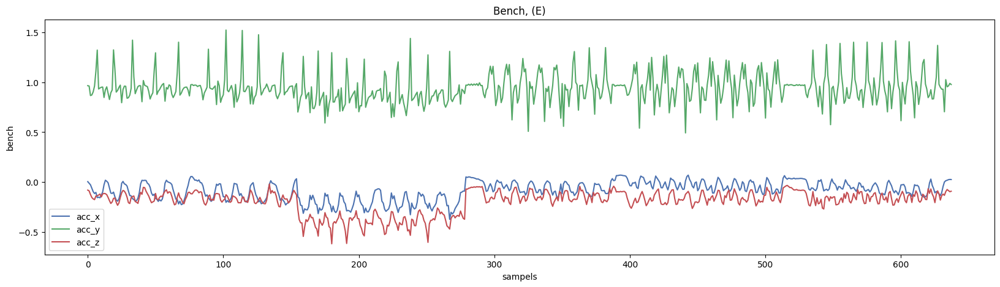

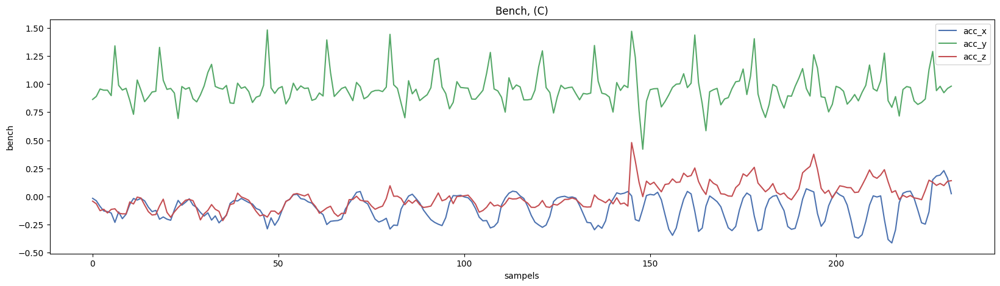

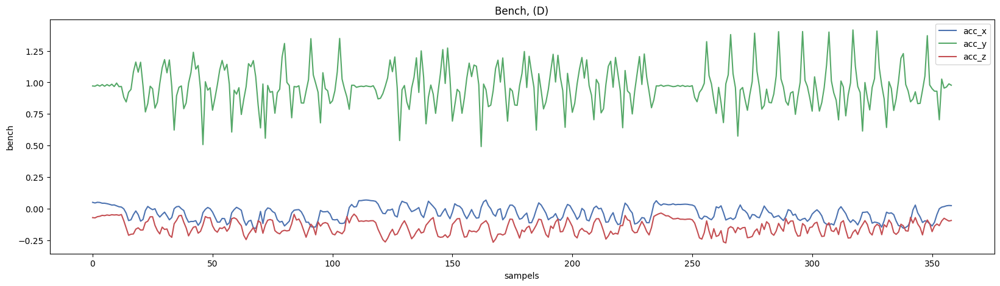

...

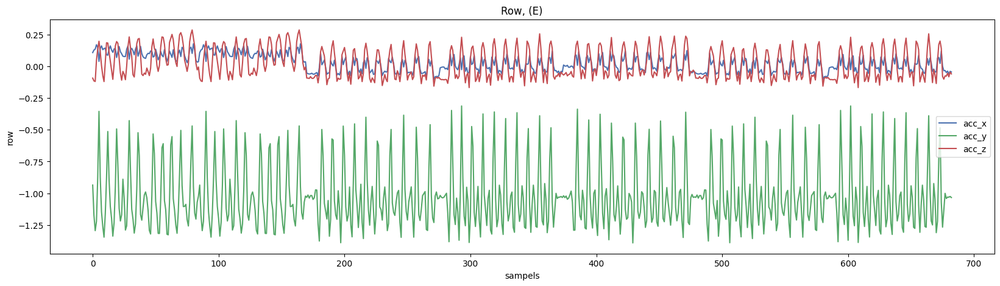

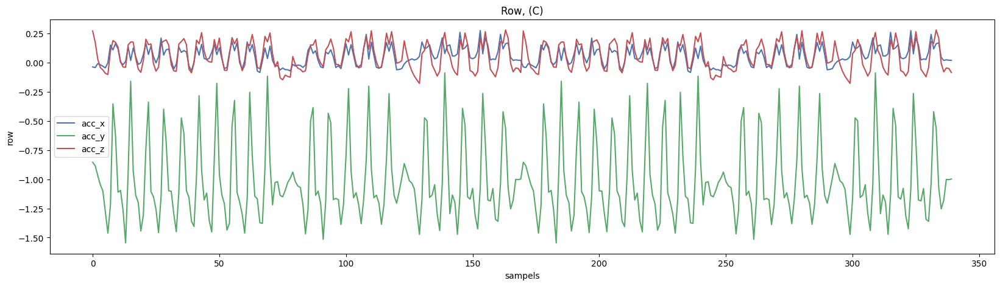

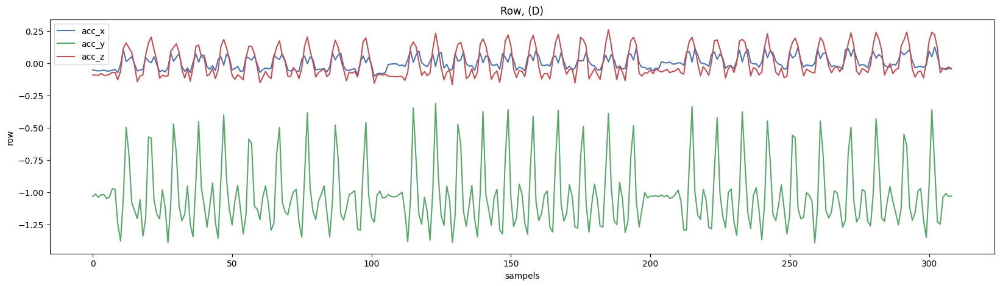

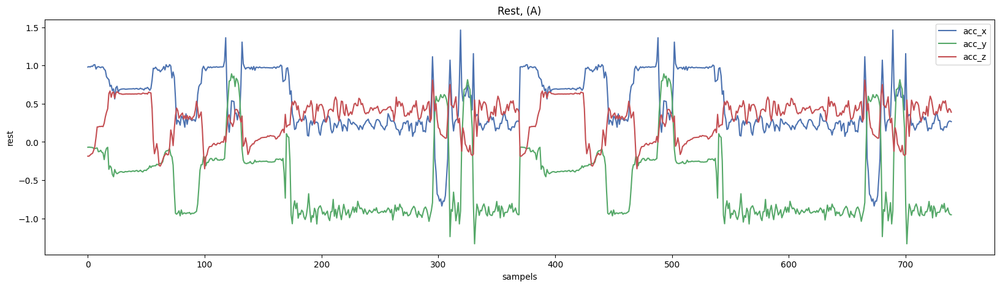

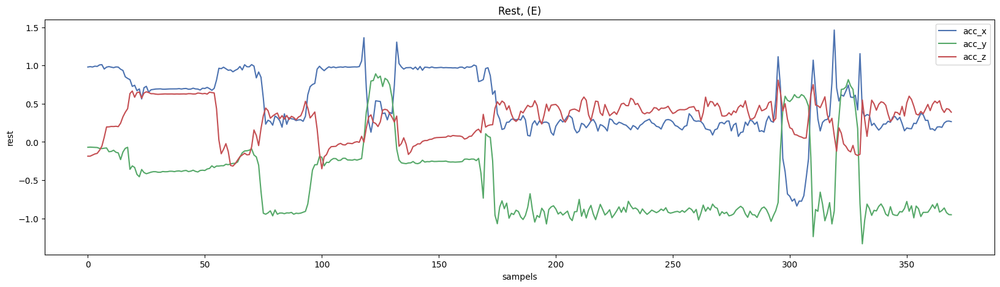

In [ ]:
labels = df['label'].unique()
parts = df['participant'].unique()
for label in labels:
    for part in parts:
        all_axis_df = df.query(f"label == '{label}'").query(f'participant == "{part}"').reset_index()
        if all_axis_df.shape[0] > 0:
            fig,ax = plt.subplots()
            all_axis_df[["acc_x", "acc_y", "acc_z"]].plot(ax=ax)
            ax.set_xlabel('sampels')
            ax.set_ylabel(label)
            plt.title(f'{label}, ({part})'.title())

/tmp/ipykernel_10394/4211784814.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig,ax = plt.subplots()


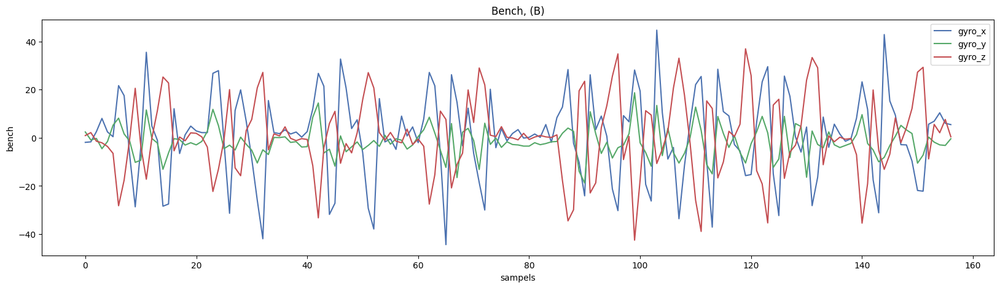

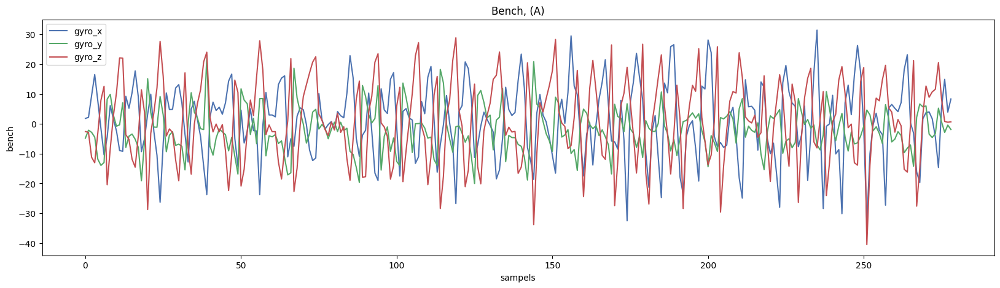

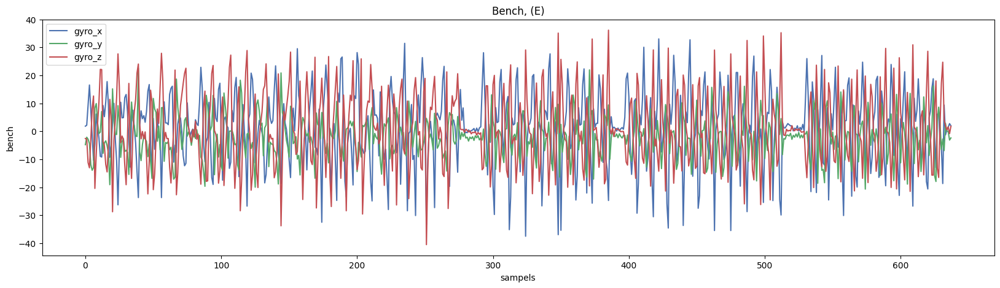

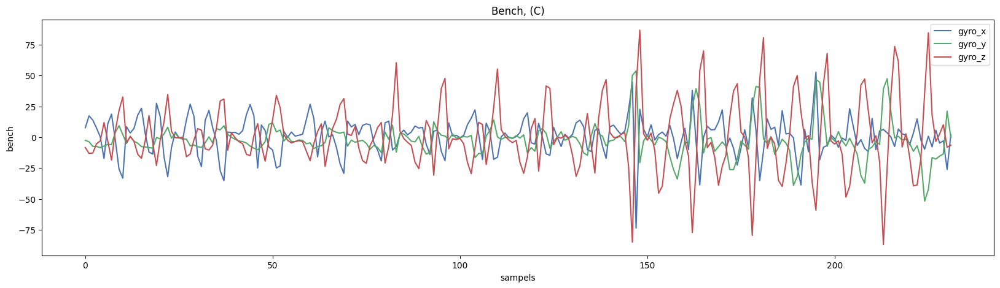

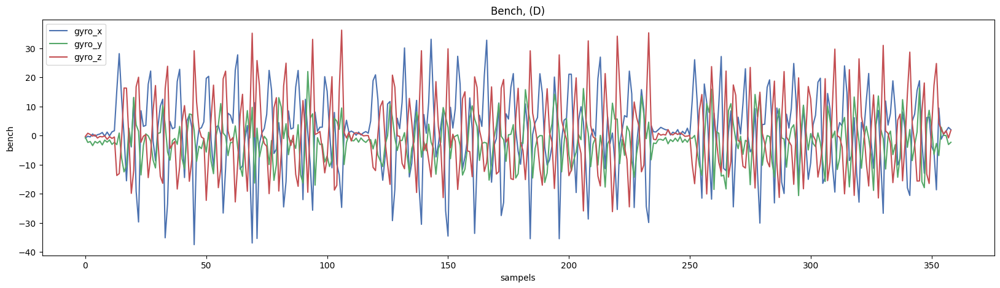

...

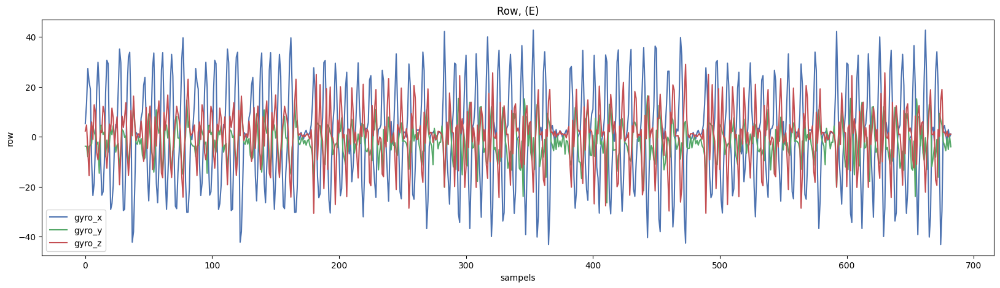

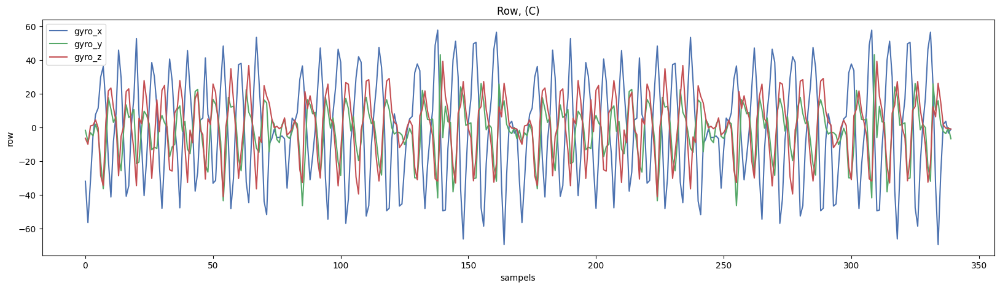

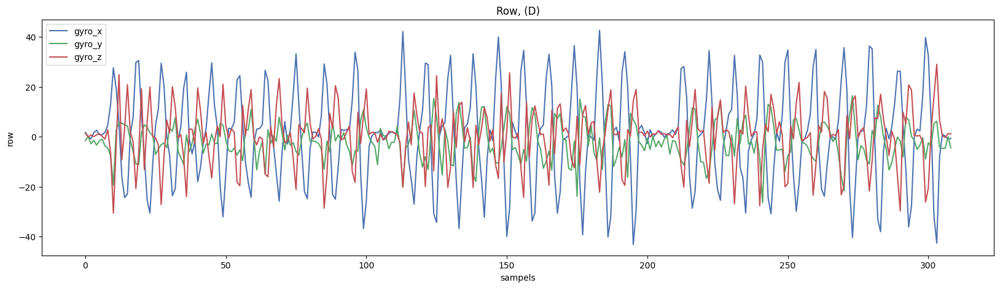

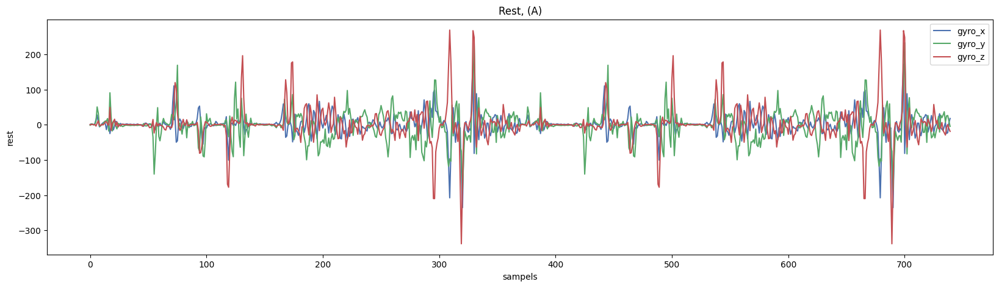

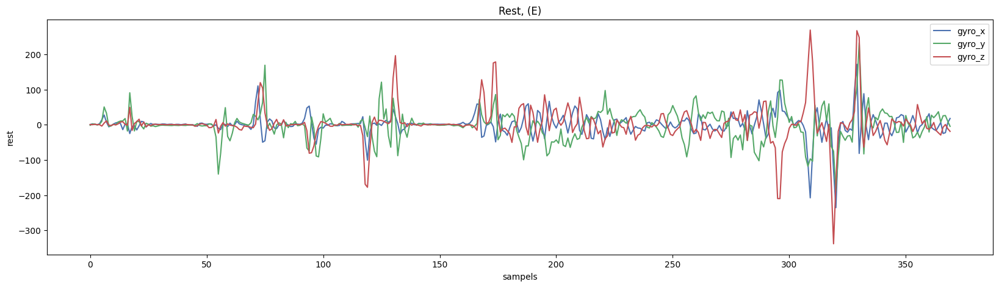

In [97]:
labels = df['label'].unique()
parts = df['participant'].unique()
for label in labels:
    for part in parts:
        all_axis_df = df.query(f"label == '{label}'").query(f'participant == "{part}"').reset_index()
        if all_axis_df.shape[0] > 0:
            fig,ax = plt.subplots()
            all_axis_df[["gyro_x", "gyro_y", "gyro_z"]].plot(ax=ax)
            ax.set_xlabel('sampels')
            ax.set_ylabel(label)
            plt.title(f'{label}, ({part})'.title())
          

In [98]:
df

,acc_x,acc_y,acc_z,gyro_x,gyro_y,gyro_z,participant,label,category,set
epoch (ms),,,,,,,,,,
2019-01-11 15:08:05.200,0.013500,0.977000,-0.071000,-1.8904,2.4392,0.9388,B,bench,heavy,30
2019-01-11 15:08:05.400,-0.001500,0.970500,-0.079500,-1.6826,-0.8904,2.1708,B,bench,heavy,30
2019-01-11 15:08:05.600,0.001333,0.971667,-0.064333,2.5608,-0.2560,-1.4146,B,bench,heavy,30
2019-01-11 15:08:05.800,-0.024000,0.957000,-0.073500,8.0610,-4.5244,-2.0730,B,bench,heavy,30
2019-01-11 15:08:06.000,-0.028000,0.957667,-0.115000,2.4390,-1.5486,-3.6098,B,bench,heavy,30
...,...,...,...,...,...,...,...,...,...,...
2019-01-20 17:33:27.000,-0.048000,-1.041500,-0.076500,1.4146,-5.6218,0.2926,E,row,medium,90
2019-01-20 17:33:27.200,-0.037000,-1.030333,-0.053333,-2.7684,-0.5854,2.2440,E,row,medium,90
2019-01-20 17:33:27.400,-0.060000,-1.031000,-0.082000,2.8416,-5.1342,-0.1220,E,row,medium,90


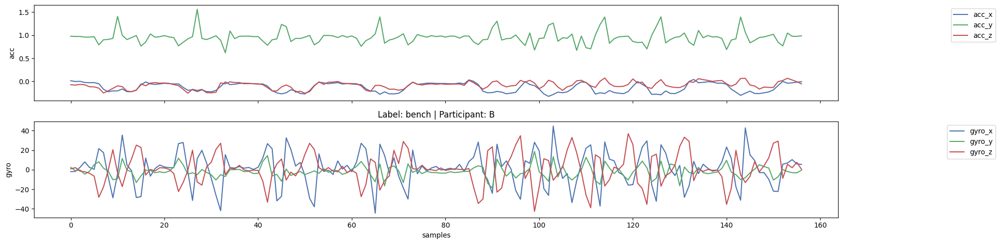

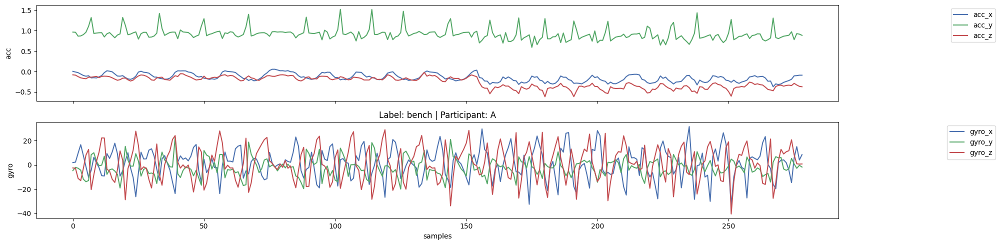

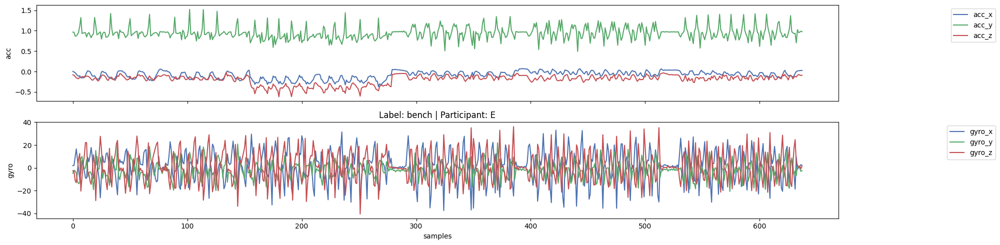

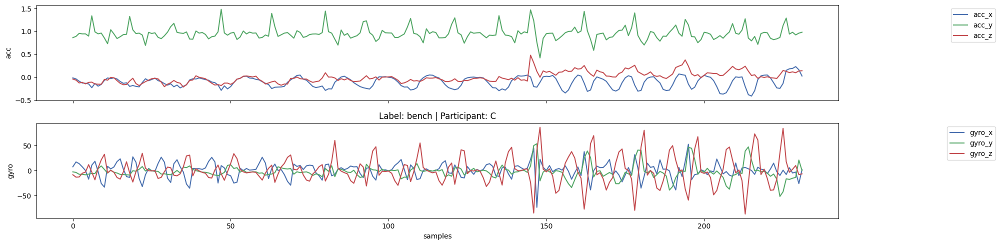

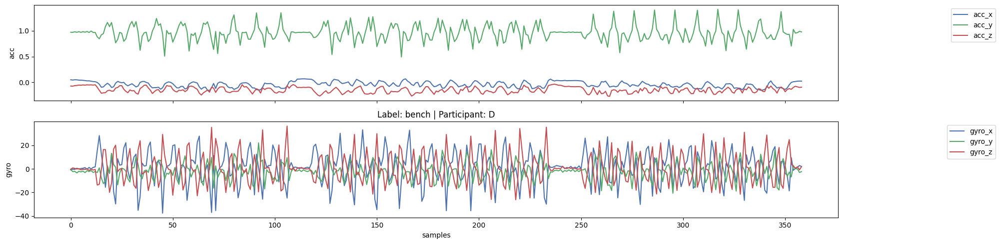

...

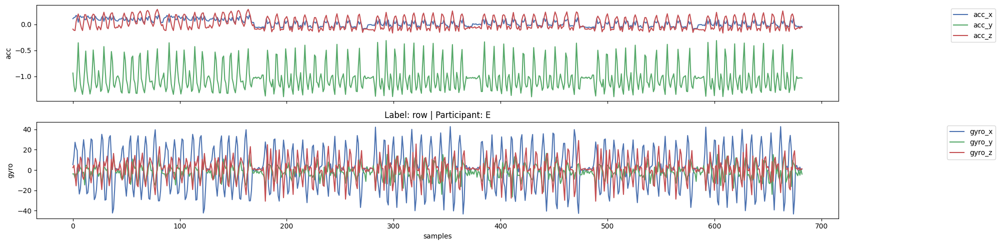

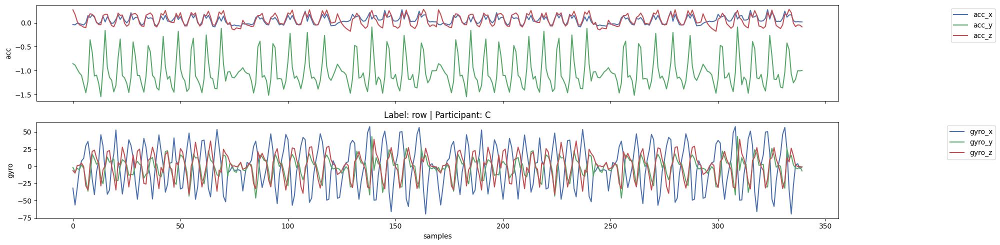

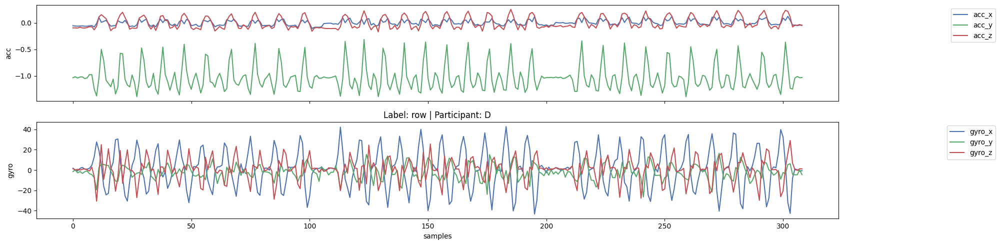

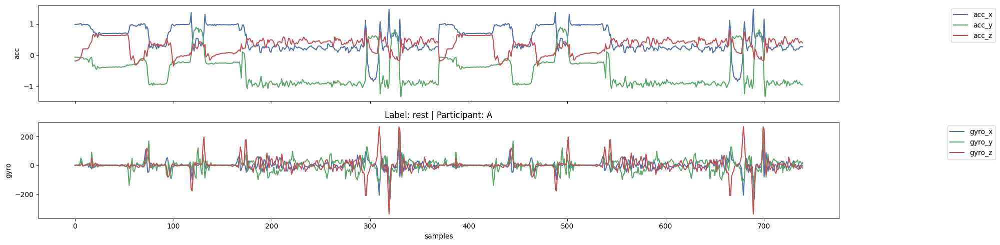

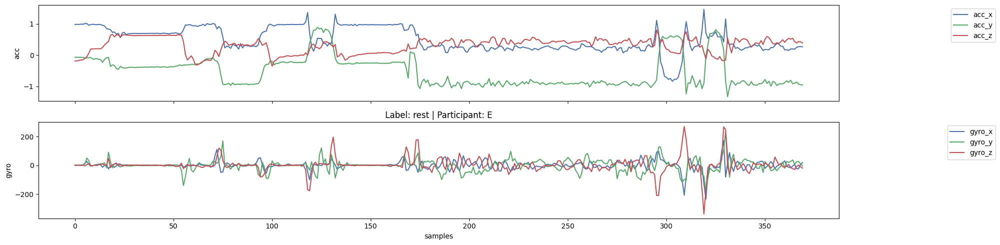

In [107]:

labels = df['label'].unique()
participants = df['participant'].unique()

for label in labels:
    for part in participants:
        subset = df[(df['label'] == label) & (df['participant'] == part)].reset_index()

        if subset.shape[0] > 0:
            fig, ax = plt.subplots(nrows=2, sharex=True)

            subset[["acc_x", "acc_y", "acc_z"]].plot(ax=ax[0])
            subset[["gyro_x", "gyro_y", "gyro_z"]].plot(ax=ax[1])

            ax[0].legend(loc='upper right', bbox_to_anchor=(1.2, 1), fancybox=True)
            ax[1].legend(loc='upper right', bbox_to_anchor=(1.2, 1), fancybox=True)

            ax[0].set_xlabel('samples')
            ax[0].set_ylabel("acc")

            ax[1].set_xlabel("samples")
            ax[1].set_ylabel("gyro")

            plt.title(f"Label: {label} | Participant: {part}")

            plt.tight_layout()

            # لو عايز تحفظ
            plt.savefig(f"../reports/figures/plot_{label}_{part}.png")

            plt.show()